In [1]:
import datetime, warnings, scipy
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline, make_pipeline
from scipy import stats as st

#import pandas
from keras.models import Sequential
from keras.layers import Dense # fully connected layers
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, KFold, RepeatedKFold
from sklearn.preprocessing import StandardScaler
import datetime
from datetime import date
from datetime import datetime
import winsound

In [ ]:
pd.options.display.max_columns = 50

### Loading Datasets

In [2]:
flights_train = pd.read_pickle('flights_train.pickle')
flights_test = pd.read_pickle('flights_test.pickle')

In [3]:
flights_train.head()

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,DISTANCE,SCHEDULED_ARRIVAL,ARRIVAL_DELAY,DEPARTURE_TIME1,SCHEDULED_DEPARTURE1,DEPARTURE_DELAY
id,,,,,,,,,,,,,,,,,,,,
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,2354.0,21.0,15.0,205.0,1448,430,-22.0,23:54:00,00:05:00,-11.0
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,2.0,12.0,14.0,280.0,2330,750,-9.0,00:02:00,00:10:00,-8.0
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,18.0,16.0,34.0,286.0,2296,806,5.0,00:18:00,00:20:00,-2.0
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,15.0,15.0,30.0,285.0,2342,805,-9.0,00:15:00,00:20:00,-5.0
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,24.0,11.0,35.0,235.0,1448,320,-21.0,00:24:00,00:25:00,-1.0


In [4]:
flights_test.head()

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,DISTANCE,SCHEDULED_ARRIVAL,DEPARTURE_TIME1,SCHEDULED_DEPARTURE1,DEPARTURE_DELAY
id,,,,,,,,,,,,,,,,,,,
0,2015,7,1,3,NK,298,N624NK,LAS,IAH,3,41.0,11.0,52.0,177.0,1222,500,00:41:00,00:03:00,38.0
1,2015,7,1,3,AA,1965,N507AY,SFO,CLT,5,2400.0,21.0,21.0,303.0,2296,808,00:00:00,00:05:00,-5.0
2,2015,7,1,3,DL,2020,N3759,LAX,MEM,5,2400.0,36.0,36.0,223.0,1619,548,00:00:00,00:05:00,-5.0
3,2015,7,1,3,NK,612,N629NK,LAS,MSP,5,53.0,14.0,107.0,178.0,1299,503,00:53:00,00:05:00,48.0
4,2015,7,1,3,UA,1044,N39418,ANC,ORD,8,17.0,20.0,37.0,364.0,2846,912,00:17:00,00:08:00,9.0


### Features

We keep columns:
* Month
* Day of week
* Airline
* Origin airport
* Destination airport
* Scheduled time
* Distance
* Departure delay

### Encoding

Category columns:
* Airline
* Origin airport
* Destination airport
* Day of week
* Month

We will try applying TARGET Encoding to non-numeric columns:
* Airline
* Origin airport
* Destination airport

In [5]:
def drop_cols(df, cols):
    df = df.drop(cols, axis=1)
    return df

In [6]:
# Drop the unnecessary cols

cols = ['DAY_OF_WEEK', 'FLIGHT_NUMBER', 'TAXI_OUT', 'YEAR', 'DAY', 'TAIL_NUMBER', 'DEPARTURE_TIME', 'WHEELS_OFF', 'DEPARTURE_TIME1', 'SCHEDULED_DEPARTURE1']

train_set = drop_cols(flights_train, cols)
test_set = drop_cols(flights_test, cols)

display(train_set.head(1), train_set.shape)
display(test_set.head(1), test_set.shape)

,MONTH,AIRLINE,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,SCHEDULED_TIME,DISTANCE,SCHEDULED_ARRIVAL,ARRIVAL_DELAY,DEPARTURE_DELAY
id,,,,,,,,,,
0,1,AS,ANC,SEA,5,205.0,1448,430,-22.0,-11.0


(2818553, 10)

,MONTH,AIRLINE,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,SCHEDULED_TIME,DISTANCE,SCHEDULED_ARRIVAL,DEPARTURE_DELAY
id,,,,,,,,,
0,7,NK,LAS,IAH,3,177.0,1222,500,38.0


(514384, 9)

In [7]:
def target_encoding(df, target_encode_columns: list, target: list):
    target_encode_df = df[target_encode_columns + target].reset_index().drop(columns = 'id', axis = 1)
    target_name = target[0]
    target_df = pd.DataFrame()
    encoding_vals = {}
    for embed_col in target_encode_columns:
        val_map = target_encode_df.groupby(embed_col)[target].mean().to_dict()[target_name]
        target_df[embed_col] = target_encode_df[embed_col].map(val_map).values
        encoding_vals[embed_col] = val_map
    score_target_drop = df.drop(target_encode_columns, axis = 1).reset_index().drop(columns = 'id', axis = 1)
    score_target = pd.concat([score_target_drop, target_df], axis = 1)
    
    return score_target, encoding_vals

In [8]:
def test_encoding(df, encoding_vals):
    target_encode_columns = [col for col in encoding_vals.keys()]
    target_encode_df = df[target_encode_columns].reset_index().drop(columns = 'id', axis = 1)
    target_df = pd.DataFrame()
    for embed_col in encoding_vals.keys():
        val_map = encoding_vals[embed_col]
        target_df[embed_col] = target_encode_df[embed_col].map(val_map).values
    score_target_drop = df.drop(target_encode_columns, axis = 1).reset_index().drop(columns = 'id', axis = 1)
    score_target = pd.concat([score_target_drop, target_df], axis = 1)
    return score_target

In [9]:
# target_encode_columns = ['AIRLINE', 'ORIGIN_AIRPORT', 'DESTINATION_AIRPORT', 'DAY_OF_WEEK', 'MONTH', 'FLIGHT_NUMBER']
target_encode_columns = ['ORIGIN_AIRPORT', 'DESTINATION_AIRPORT', 'AIRLINE']
target = ['ARRIVAL_DELAY']
train, encoding_vals = target_encoding(train_set, target_encode_columns, target)

X_train =train.drop(columns=['ARRIVAL_DELAY'])
Y_train = train['ARRIVAL_DELAY']

X_test = test_encoding(test_set, encoding_vals)

display(X_train.shape, X_train.dtypes)
display(X_test.shape, X_test.dtypes)

(2818553, 9)

MONTH                    int64
SCHEDULED_DEPARTURE      int64
SCHEDULED_TIME         float64
DISTANCE                 int64
SCHEDULED_ARRIVAL        int64
DEPARTURE_DELAY        float64
ORIGIN_AIRPORT         float64
DESTINATION_AIRPORT    float64
AIRLINE                float64
dtype: object

(514384, 9)

MONTH                    int64
SCHEDULED_DEPARTURE      int64
SCHEDULED_TIME         float64
DISTANCE                 int64
SCHEDULED_ARRIVAL        int64
DEPARTURE_DELAY        float64
ORIGIN_AIRPORT         float64
DESTINATION_AIRPORT    float64
AIRLINE                float64
dtype: object

# LightGBM

In [10]:
import lightgbm as lgb

In [11]:
d_train = lgb.Dataset(X_train, label=Y_train)

In [ ]:
# Notas params

params = {
    'task': 'predict',
    'objective': 'regression',
    'metric': 'mse',
    'boosting_type': 'gbdt',
    'n_jobs': 4,
    'num_iterations': 7500
    'learning_rate': 0.01,
    'num_leaves': 128,
    'bagging_fraction': 0.7,
    'bagging_freq': 1,
    'feature_fraction': 0.5
    'bagging_seed': 42,
    'verbosity': 1,
    'random_state': 42,
    'force_col_wise': True
}

In [12]:
# params = {
#         "objective" : "regression",
#         "metric" : "rmse",
#         "num_leaves" : 64,
#         "learning_rate" : 0.005,
#         "bagging_fraction" : 0.7,
#         "feature_fraction" : 0.5,
#         "bagging_frequency" : 6,
#         "bagging_seed" : 42,
#         "verbosity" : 1,
#         "seed": 42,
#         }

params = {
        'metric' : "mse",
        'num_iterations' : 5000,
        'learning_rate' : 0.005,
        'num_leaves' : 90,
        'bagging_fraction' : 0.7,
        'bagging_freq' : 1,
        'feature_fraction' : 0.5,
        'bagging_seed' : 42,
        'verbosity' : 3,
        'random_state' : 42
        }

Y_train = Y_train.ravel()
model_lgb = lgb.train(params, d_train)
predictions = model_lgb.predict(X_test)

# SCORE: 85.46231 with 12 features
winsound.Beep(445, 1000)

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006205
[LightGBM] [Debug] init for col-wise cost 0.000509 seconds, init for row-wise cost 0.094780 seconds
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Dense Multi-Val Bin
[LightGBM] [Info] Total Bins 1691
[LightGBM] [Info] Number of data points in the train set: 2818553, number of used features: 9
[LightGBM] [Info] Start training from score 6.001171
[LightGBM] [Debug] Re-bagging, using 1974116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and dept

[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1973282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1973673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972579 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1973448 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1971847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972806 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1970422 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1971709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1973281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972623 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973684 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1974602 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972218 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1974313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1973090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973505 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972012 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1972322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972525 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1972720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1970924 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973868 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972792 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972668 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1974731 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1973814 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973554 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1970131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973641 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1974288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1974030 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972568 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1973180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1974383 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1971073 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973771 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973705 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972825 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972250 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973247 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973056 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972321 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972087 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1974263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972780 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972889 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1973088 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1971053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1974053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1974641 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1974542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1973711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1970992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973613 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973929 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973495 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973406 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1973841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972474 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973015 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1971759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972687 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973474 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973033 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973657 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1974037 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973424 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972740 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1973173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1971531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972656 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972771 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972919 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973062 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1972994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973652 data to train


[LightGBM] [Debug] Re-bagging, using 1973183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1974035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973690 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1973632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1972922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1971899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972515 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973490 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972396 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1974114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972881 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1972834 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1974165 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972788 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1974198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972633 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1971426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972292 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1973752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1974033 data to train


[LightGBM] [Debug] Re-bagging, using 1972444 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1974226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11


[LightGBM] [Debug] Re-bagging, using 1973050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1972635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972668 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1973007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1972582 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1972471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1970943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22


[LightGBM] [Debug] Re-bagging, using 1972908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1973422 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972429 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1974725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973337 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1973074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973568 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1973252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972878 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973381 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22


[LightGBM] [Debug] Re-bagging, using 1973469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1973146 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972958 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1971521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1972543 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1973144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1972677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1972601 data to train


[LightGBM] [Debug] Re-bagging, using 1972990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1972076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973935 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973039 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21


[LightGBM] [Debug] Re-bagging, using 1973681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973662 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1971133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1973315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973337 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972788 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1973338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1972403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1973020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972647 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1971146 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1973647 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973363 data to train


[LightGBM] [Debug] Re-bagging, using 1972856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1971993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973444 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1971229 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1971582 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972746 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1974087 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1972198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1972830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1974128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1973350 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 29
[LightGBM] [Debug] Re-bagging, using 1973409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1974050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973297 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1971105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1973051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1973358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1973453 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1970868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1973369 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973890 data to train


[LightGBM] [Debug] Re-bagging, using 1972361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1973118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1972809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1972189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1973798 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972309 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973058 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1972096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973010 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972705 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1971905 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972363 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973184 data to train


[LightGBM] [Debug] Re-bagging, using 1971846 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973442 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973274 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973491 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Re-bagging, using 1973116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1973648 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1973387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1973945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1972899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1973073 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1974271 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973910 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1974646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1973895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972965 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973460 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973005 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1974156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1973800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1972313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 29
[LightGBM] [Debug] Re-bagging, using 1973232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972852 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1973284 data to train


[LightGBM] [Debug] Re-bagging, using 1972757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1974251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973005 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973805 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1974537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972579 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972948 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1973570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973715 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1973694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1971795 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973136 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972870 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1973206 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1973325 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1972316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973483 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972848 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972970 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972977 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1970295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972482 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1973082 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972123 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972191 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973247 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972796 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1974392 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972905 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1973040 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972236 data to train


[LightGBM] [Debug] Re-bagging, using 1969048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973190 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19


[LightGBM] [Debug] Re-bagging, using 1972845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1972683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1974040 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1973268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972510 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1972533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1972759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1970895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1974260 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973325 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1974575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Re-bagging, using 1973968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1971149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1973221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972495 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Re-bagging, using 1972108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972935 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972549 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973021 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973022 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Re-bagging, using 1973388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972584 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1974111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973907 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972831 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1970414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973015 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972543 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973528 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973157 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1971196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1974643 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1974623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973711 data to train


[LightGBM] [Debug] Re-bagging, using 1972744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1971763 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1972067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973790 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Re-bagging, using 1971233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1974174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972802 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1971840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972549 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1973249 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1972738 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973629 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972588 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972719 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1970977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1969926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1972839 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973211 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1971027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1971973 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1974028 data to train


[LightGBM] [Debug] Re-bagging, using 1972332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1973840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973879 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1971997 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1974141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1973373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1973977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1973593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1975267 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1974242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972647 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1971401 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1974019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1972931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973480 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972411 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1974004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973048 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972715 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972023 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972817 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972815 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1973949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973474 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1974005 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972970 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973675 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1973087 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1973984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973077 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973108 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1973201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973024 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1974501 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972924 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1973101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1969399 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972797 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1973103 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1973417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1972637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1972536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1971871 data to train


[LightGBM] [Debug] Re-bagging, using 1974392 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1972862 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973452 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1971867 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1973059 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1974661 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Re-bagging, using 1974138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1972974 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973203 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1972861 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1972202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1973311 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1975818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1972257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1974509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1972956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1974129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1972510 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1973732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1973439 data to train


### GRID SEARCH

In [30]:
from sklearn.model_selection import GridSearchCV

In [22]:
np.random.seed(1)

gkf = KFold(n_splits=5, shuffle=True, random_state=42).split(X=X_train, y=Y_train)

In [26]:
lgb.LGBMRegressor?

# params = {
#         'metric' : "mse",
#         'num_iterations' : 5000,
#         'learning_rate' : 0.005,
#         'num_leaves' : 90,
#         'bagging_fraction' : 0.7,
#         'bagging_freq' : 1,
#         'feature_fraction' : 0.5,
#         'bagging_seed' : 42,
#         'verbosity' : 3,
#         'random_state' : 42
#         }

In [33]:
param_grid = {    
        'num_iterations' : [5000],
        'learning_rate' : [0.005, 0.01],
        'bagging_fraction' : [0.7],
        'bagging_freq' : [1],
        'feature_fraction' : [0.5],
        'bagging_seed' : [42],
        'verbosity' : [3],
        'random_state' : [42],
        'num_leaves': [31, 90, 127],
        'reg_alpha': [0.05, 0.1, 0.5],
    }
# lgb.LGBMRegressor

lgb_model = lgb.LGBMRegressor(boosting_type='gbdt', metric="mse", num_boost_round=2000)

gsearch = GridSearchCV(estimator=lgb_model, param_grid=param_grid, cv=gkf)
lgb_model = gsearch.fit(X=X_train, y=Y_train)

print(lgb_model.best_params_, lgb_model.best_score_)

winsound.Beep(440, 1000)

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006151
[LightGBM] [Debug] init for col-wise cost 0.000025 seconds, init for row-wise cost 0.078766 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579057 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578806 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578750 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578736 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578861 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578163 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579513 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578428 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576753 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578096 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578463 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577903 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577898 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576705 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578755 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577410 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578200 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577843 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578578 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578594 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1576450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577979 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577805 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578207 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578504 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Li

[LightGBM] [Debug] Re-bagging, using 1578763 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[L

[LightGBM] [Debug] Re-bagging, using 1577086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578081 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578584 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1578411 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576973 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577671 data to train


[LightGBM] [Debug] Re-bagging, using 1578593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577139 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Ligh

[LightGBM] [Debug] Re-bagging, using 1576932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577784 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579203 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579182 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1575926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580220 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578852 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578550 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578986 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11


[LightGBM] [Debug] Re-bagging, using 1578781 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578451 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579247 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578524 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578872 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579054 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578568 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578772 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578079 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578320 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579022 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578325 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576808 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578781 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578797 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578695 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577940 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578030 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579025 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578763 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578302 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577831 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576427 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578534 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578781 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578497 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577791 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1576430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578483 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[

[LightGBM] [Debug] Re-bagging, using 1578747 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577648 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576488 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578184 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578580 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578426 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578177 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578190 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579278 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579506 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577892 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578037 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579386 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578248 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Re-bagging, using 1577932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576958 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578443 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579494 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Re-bagging, using 1578355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578177 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578071 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[Lig

[LightGBM] [Debug] Re-bagging, using 1578095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1579710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578633 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577102 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1579237 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579167 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579443 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577699 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576796 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578615 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578715 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579827 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577911 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578822 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578948 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579568 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578796 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577976 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579021 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577903 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579327 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579249 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576574 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577715 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578125 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578490 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578661 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578772 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578313 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1580211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578639 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577687 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1578909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577695 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1579342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[Li

[LightGBM] [Debug] Re-bagging, using 1578412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578944 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578217 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[L

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006219
[LightGBM] [Debug] init for col-wise cost 0.000017 seconds, init for row-wise cost 0.094351 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579057 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579550 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578139 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578750 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578736 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579853 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576930 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577826 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578615 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579633 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579111 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578918 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578699 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578627 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578191 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577952 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578680 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578327 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578147 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578438 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578435 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578505 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578443 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577695 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578970 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579583 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577715 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578401 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578558 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577820 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578278 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578682 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1577908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577741 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578684 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578501 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578881 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579271 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577975 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576444 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1576580 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578724 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577861 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578661 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577505 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578703 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579082 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579348 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578647 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579012 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580083 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578401 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579136 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578594 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578785 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579249 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578839 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1575942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578422 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578511 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579031 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578715 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577982 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577737 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[Li

[LightGBM] [Debug] Re-bagging, using 1578504 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578237 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1580091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577602 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579190 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578584 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578661 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578298 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579462 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577781 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579177 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576940 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577308 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577139 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577497 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Lig

[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577784 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579203 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579182 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580220 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578852 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577038 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578192 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578986 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576746 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578781 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578451 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579247 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579464 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578524 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578872 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578568 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578772 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578443 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577157 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579022 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578602 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578325 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578291 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578609 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576808 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577790 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577846 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578096 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576146 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578831 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576427 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578112 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578688 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579725 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577791 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578951 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579166 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578818 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577380 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577878 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577524 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577630 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578226 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578136 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577477 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578298 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577991 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578613 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577892 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578037 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577568 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578248 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578505 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576958 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[L

[LightGBM] [Debug] Re-bagging, using 1578832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579494 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578177 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578071 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579741 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577102 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579167 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579443 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577699 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576796 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1578611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578615 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579827 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577911 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579358 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578822 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578948 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579568 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578796 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577976 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579021 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577903 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579249 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577634 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577944 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577715 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577734 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578125 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578755 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1575986 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578661 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578772 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578788 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578104 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577738 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579075 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[L

[LightGBM] [Debug] Re-bagging, using 1578780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579647 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579039 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12


[LightGBM] [Debug] Re-bagging, using 1578353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578716 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1578398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579037 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578944 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578121 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577191 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578852 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006153
[LightGBM] [Debug] init for col-wise cost 0.000018 seconds, init for row-wise cost 0.101524 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579057 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578806 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577803 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579550 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578015 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578750 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578736 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578799 data to train
[Light

[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576930 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Light

[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578861 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578918 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578699 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577952 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578766 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578327 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578463 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578227 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577786 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577903 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578371 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578614 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577898 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576580 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578724 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576705 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578392 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578755 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577410 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578291 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578578 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578594 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577979 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578715 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577805 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578207 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578504 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578763 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578081 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578584 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578817 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578411 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576973 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578212 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577935 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578897 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577813 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578102 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577784 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[Li

[LightGBM] [Debug] Re-bagging, using 1578445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1575926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[L

[LightGBM] [Debug] Re-bagging, using 1579221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578904 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578550 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578986 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577826 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578781 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578451 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578719 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578733 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578524 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578872 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1578462 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1581128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[Li

[LightGBM] [Debug] Re-bagging, using 1579382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Lig

[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578320 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Re-bagging, using 1577499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1578192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1578805 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576967 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579177 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578781 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577879 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577975 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577940 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578030 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[L

[LightGBM] [Debug] Re-bagging, using 1577719 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578763 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578302 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578781 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578497 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579519 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578483 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578747 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577648 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1579471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576488 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578184 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578580 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577961 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578177 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578136 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Re-bagging, using 1579124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[

[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Re-bagging, using 1579506 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577892 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1579385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579386 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578248 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576958 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578169 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578443 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579494 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578177 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578071 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579741 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578633 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577102 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579237 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579167 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579443 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577699 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576796 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Re-bagging, using 1578236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578615 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[Li

[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579827 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577911 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1578948 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579568 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578796 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577976 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579021 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577903 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579327 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579249 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578819 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577944 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577715 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578125 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578516 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1575986 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578661 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578772 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579295 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578104 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577738 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579075 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578162 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579647 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579039 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577613 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578294 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578716 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578183 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577730 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579037 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577188 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578891 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579472 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578121 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577191 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578852 data to train
[L

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006270
[LightGBM] [Debug] init for col-wise cost 0.000014 seconds, init for row-wise cost 0.076446 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1576950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578388 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1575151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578246 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579525 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577787 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Re-bagging, using 1578449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577951 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577788 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579184 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[Light

[LightGBM] [Debug] Re-bagging, using 1578218 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578600 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578991 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578581 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Re-bagging, using 1579230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578552 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578371 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576889 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578867 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580327 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578291 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578742 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578609 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578848 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578203 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578588 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579306 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578454 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578797 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578834 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1577794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578540 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578207 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578476 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579930 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578005 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578619 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578455 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577598 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578508 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580082 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578530 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578059 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578806 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578594 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578758 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579146 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Li

[LightGBM] [Debug] Re-bagging, using 1578772 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576790 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Light

[LightGBM] [Debug] Re-bagging, using 1577890 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578325 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578836 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577654 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578364 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577959 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578024 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1578995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578657 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578730 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1576445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579312 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577855 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579127 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577202 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1575754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577613 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577800 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577802 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578440 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579563 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578538 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577802 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578098 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578890 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578399 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578580 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[

[LightGBM] [Debug] Re-bagging, using 1578712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1576859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578495 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578253 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577200 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577827 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579243 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578113 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578703 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579657 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577991 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577438 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578010 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578947 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578022 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578578 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578439 data to train


[LightGBM] [Debug] Re-bagging, using 1578088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577918 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578944 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578682 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578345 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577260 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579359 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578812 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577870 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578136 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577311 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578718 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1580065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579460 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576953 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578113 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1574670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579478 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579488 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578188 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578904 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578220 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578729 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576880 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577742 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578497 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578791 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1581008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578939 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578502 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579193 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577624 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577392 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578059 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578855 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579166 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578337 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579386 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578341 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578215 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577831 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578302 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[Li

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006118
[LightGBM] [Debug] init for col-wise cost 0.008007 seconds, init for row-wise cost 0.141547 seconds
[Li

[LightGBM] [Debug] Re-bagging, using 1578119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1575151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578246 data to train
[LightG

[LightGBM] [Debug] Re-bagging, using 1579525 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577787 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577951 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1577995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577788 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579184 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Light

[LightGBM] [Debug] Re-bagging, using 1578600 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578991 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578581 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578661 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578552 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578371 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576889 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578867 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578056 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580327 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578291 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[Light

[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578742 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Re-bagging, using 1578853 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578848 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578203 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578588 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579306 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578454 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578578 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578797 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578834 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578540 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578514 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578921 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578207 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578937 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578578 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579930 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1578502 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578455 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577598 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578508 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1580082 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578530 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578059 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578594 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578758 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579146 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Re-bagging, using 1579353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576790 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578528 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578836 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578016 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578226 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577959 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578024 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11


[LightGBM] [Debug] Re-bagging, using 1577534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578657 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578730 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578668 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577855 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579127 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577152 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577613 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577897 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578440 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580808 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579563 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578538 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577802 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577870 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578580 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578758 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578463 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1577652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578253 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579818 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579243 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578502 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579135 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578113 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578703 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577971 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578080 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578370 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578414 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577438 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578010 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578549 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578022 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577678 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579469 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578271 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578944 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1575677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579056 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Re-bagging, using 1576397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578506 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577260 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576523 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579359 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578812 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578162 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578136 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579109 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577699 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579565 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578718 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1580065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579240 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579460 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576953 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578113 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11


[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1574670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578309 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579702 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577734 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578497 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578791 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579482 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576910 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1578002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1581008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579320 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577947 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578502 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579193 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577392 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578745 data to train


[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578059 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Lig

[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578855 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[Li

[LightGBM] [Debug] Re-bagging, using 1579166 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[

[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578337 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579386 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578875 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578215 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577831 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578878 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577333 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1577421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578302 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006151
[LightGBM] [Debug] init for col-wise cost 0.000027 seconds, init for row-wise cost 0.162028 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577875 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1578320 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579538 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578879 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1577721 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578411 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578597 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578615 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577965 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Re-bagging, using 1578817 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Re-bagging, using 1579225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577022 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578462 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578460 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578639 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578346 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578586 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578975 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578821 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578440 data to train


[LightGBM] [Debug] Re-bagging, using 1578505 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578771 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578792 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Re-bagging, using 1578006 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578515 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577790 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578546 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578045 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578904 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578764 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578927 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577641 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578853 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578136 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577589 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578747 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578741 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577960 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578056 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578814 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578595 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578591 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577846 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1576922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578278 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578125 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577998 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578968 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578351 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1576880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578633 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578204 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578460 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577735 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577879 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579454 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578386 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577406 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579844 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578717 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579474 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577889 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577848 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578624 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577790 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1575927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578627 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1575766 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578376 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1577681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578724 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578891 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[

[LightGBM] [Debug] Re-bagging, using 1579434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578668 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578015 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577913 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578901 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578429 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578615 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580134 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576857 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579104 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578523 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1575533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578887 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578107 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578217 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579667 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577962 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577071 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578962 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577785 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579731 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578188 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578311 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578341 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578598 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577515 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577736 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578952 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578324 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578771 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578452 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577588 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578964 data to train
[

[LightGBM] [Debug] Re-bagging, using 1577908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577619 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576872 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578075 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577727 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[L

[LightGBM] [Debug] Re-bagging, using 1577463 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578727 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578695 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[

[LightGBM] [Debug] Re-bagging, using 1579611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577919 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Re-bagging, using 1578358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579125 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579504 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578057 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1577590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578662 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578719 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578924 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579763 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579586 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578634 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578742 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578492 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1580344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579206 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578558 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578822 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578795 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578504 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579021 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578490 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578627 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577192 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578324 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579039 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578639 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577687 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1578716 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578611 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578944 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578217 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578121 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577191 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578852 data to train
[L

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006219
[LightGBM] [Debug] init for col-wise cost 0.000059 seconds, init for row-wise cost 0.101490 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579550 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGB

[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578750 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578736 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576930 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579768 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578861 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[Light

[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578766 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578096 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578463 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577943 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578929 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578896 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577843 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578250 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579329 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1578743 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578422 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1580096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576806 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578795 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578367 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578434 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578696 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578982 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578647 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578204 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579209 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577823 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578691 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579231 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577773 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1577175 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578429 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578979 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[

[LightGBM] [Debug] Re-bagging, using 1578089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578510 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1580826 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579112 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578219 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1577028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Re-bagging, using 1578788 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578367 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577458 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577442 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578381 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578501 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578494 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578147 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578535 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578688 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578432 data to train


[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577974 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578613 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577976 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1577290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[

[LightGBM] [Debug] Re-bagging, using 1578220 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578550 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577077 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579297 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578609 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577865 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579263 data to train


[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579170 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578959 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Re-bagging, using 1579020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578167 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578508 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578369 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578023 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577690 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Re-bagging, using 1578529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576483 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578843 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576794 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578703 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576891 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576980 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579116 data to train


[LightGBM] [Debug] Re-bagging, using 1579532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578286 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579875 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578240 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578248 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578865 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578454 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578584 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578073 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578467 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578958 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578359 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580147 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577718 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579033 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579427 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577659 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578219 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576901 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579073 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578337 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Re-bagging, using 1579617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577798 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576231 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1580126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579024 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577998 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578657 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578014 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578852 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579321 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578696 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576558 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578419 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Re-bagging, using 1578733 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578639 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579738 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578836 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006153
[LightGBM] [Debug] init for col-wise cost 0.000041 seconds, init for row-wise cost 0.129518 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577393 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578750 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578736 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578861 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578462 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578346 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579626 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1577388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578821 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578440 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578904 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579040 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578250 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579047 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578743 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578422 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[

[LightGBM] [Debug] Re-bagging, using 1577644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578795 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578367 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578434 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578665 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578812 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578696 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Re-bagging, using 1578213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577967 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578982 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1577964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578204 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579209 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578691 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579009 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577773 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578429 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578979 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578510 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578170 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579144 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579112 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578219 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1577028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577907 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579490 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1575273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577458 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578381 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578501 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578494 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578147 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578865 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579011 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578731 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579758 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578463 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579529 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578243 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578940 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578344 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579297 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579643 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578609 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577865 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579012 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578959 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579307 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577583 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579301 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1579053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578023 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578765 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579044 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1577871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577690 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579277 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578843 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1579529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579185 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578703 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576891 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576980 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578286 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579875 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1577798 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578240 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578248 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578865 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1578691 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578203 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578584 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578073 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578524 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578958 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577449 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577126 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577588 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578030 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577718 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576898 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579572 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579209 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1580126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579024 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578060 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578435 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577998 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578696 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578733 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578639 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006270
[LightGBM] [Debug] init for col-wise cost 0.003706 seconds, init for row-wise cost 0.188181 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1576950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1575151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578178 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577387 data to train
[LightG

[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578734 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578640 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578859 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577951 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577788 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579184 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578991 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578581 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579076 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578661 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578819 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578452 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578123 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578371 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576889 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578867 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578291 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577415 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578742 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578609 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578260 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578203 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578588 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579306 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578454 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577554 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578797 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578834 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578540 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578678 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579026 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578207 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579930 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578005 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578619 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578455 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577598 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578508 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577667 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580082 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578530 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578059 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578594 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578758 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579146 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577749 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576790 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578528 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577245 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578325 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578836 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578016 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578226 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577959 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577945 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578024 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578657 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577774 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1577420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578730 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1576445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577855 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579127 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577152 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1575754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577613 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577802 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578440 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579563 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578538 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577802 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1578607 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578890 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578399 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578580 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578850 data to train


[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578495 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578253 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577200 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577827 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579243 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578227 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578113 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577991 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577263 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577438 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578010 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578947 data to train


[LightGBM] [Debug] Re-bagging, using 1578532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578022 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577909 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578944 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1575677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578682 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577001 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578506 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577260 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579359 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578812 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577870 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578136 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579109 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577311 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578718 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1580065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577548 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579460 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576953 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578113 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1574670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578220 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578729 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578497 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578791 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1580174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579482 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576910 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1581008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578186 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579320 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577947 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578502 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579193 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577624 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577392 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578059 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579137 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578855 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579166 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578337 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579386 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578341 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578215 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577831 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578749 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578302 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[L

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006118
[LightGBM] [Debug] init for col-wise cost 0.000033 seconds, init for row-wise cost 0.144949 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578798 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579555 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576922 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578640 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579336 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577983 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577951 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578403 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579184 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578042 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[Light

[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578581 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578422 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577970 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578661 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579099 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578452 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578123 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578251 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578867 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578599 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578406 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578630 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578199 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578754 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578609 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578260 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579218 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579259 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578454 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578580 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579109 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577944 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578544 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578678 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578399 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579162 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1577269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578884 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578306 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578320 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578278 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579962 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578540 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579040 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578619 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578766 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578668 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578874 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577764 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578766 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577336 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579476 data to train
[

[LightGBM] [Debug] Re-bagging, using 1577667 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578386 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[Lig

[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578530 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576796 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579062 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[Li

[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577297 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578640 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578910 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578528 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578320 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577614 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578016 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578044 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578495 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578115 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578538 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579165 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576797 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577835 data to train
[

[LightGBM] [Debug] Re-bagging, using 1577295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578858 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577758 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578641 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577933 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578668 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576209 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578836 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578659 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578975 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577897 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578192 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580808 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578218 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579131 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576625 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577870 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576112 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13


[LightGBM] [Debug] Re-bagging, using 1578463 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579249 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578863 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578576 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1575266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Re-bagging, using 1579261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579006 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579120 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577440 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[

[LightGBM] [Debug] Re-bagging, using 1579092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578614 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578511 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578502 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579135 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578687 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578308 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579607 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578080 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578218 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580292 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578549 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578037 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577077 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579294 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579248 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577858 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579031 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579696 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577812 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579872 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578371 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578410 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578080 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576786 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578797 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577662 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578023 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577981 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578870 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579967 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578514 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578940 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577608 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578781 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578502 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579115 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578231 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578286 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578460 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578721 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578381 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578843 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578209 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578630 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578204 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577848 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Re-bagging, using 1578325 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579069 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578743 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577786 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579077 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579960 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578663 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577827 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578424 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577127 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577791 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578827 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578688 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579440 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577851 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579579 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578324 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579165 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577805 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578508 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579021 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577460 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577878 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578010 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576911 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578231 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577870 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578083 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579766 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006151
[LightGBM] [Debug] init for col-wise cost 0.000020 seconds, init for row-wise cost 0.118851 seconds
[Li

[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579538 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578879 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578597 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577022 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578462 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578460 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578639 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578346 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1580354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Re-bagging, using 1577945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578975 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578821 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1578871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578440 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578792 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578546 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578045 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578904 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578764 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577641 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579040 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578743 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578747 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578741 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578056 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578771 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578812 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579417 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577986 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579614 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577967 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578204 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578037 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578490 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577175 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578429 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580826 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578566 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578137 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578831 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578788 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578367 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578756 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578127 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578599 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579184 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578535 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578688 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577974 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577971 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578359 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577581 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578115 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578103 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578220 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578550 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1577810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578021 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578453 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579170 data to train


[LightGBM] [Debug] Re-bagging, using 1578306 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578217 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1575688 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579115 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578167 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578716 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579243 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578369 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578006 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578603 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579119 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578889 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578274 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576483 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578729 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579157 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578152 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577952 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579148 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578123 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579529 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578721 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577852 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579243 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578444 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578367 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579206 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1574678 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578817 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579497 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578540 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578006 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578890 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579714 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578492 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577742 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1578822 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578231 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578719 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578191 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578198 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578458 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579170 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577608 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578511 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578961 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578155 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577806 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578391 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577898 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578285 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577473 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577970 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578260 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578758 data to train
[

[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578321 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579910 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578874 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12


[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577843 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578764 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579223 data to train
[

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006219
[LightGBM] [Debug] init for col-wise cost 0.000020 seconds, init for row-wise cost 0.108951 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578524 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1577646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578736 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579533 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578861 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[Light

[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578821 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1579295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578440 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577929 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578546 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578904 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Lig

[LightGBM] [Debug] Re-bagging, using 1578066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577641 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579040 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Ligh

[LightGBM] [Debug] Re-bagging, using 1577051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1579947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Re-bagging, using 1579205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578743 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578741 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578771 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579567 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577314 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578812 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579417 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578686 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577998 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577986 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579614 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577967 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578037 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579454 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578490 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1576439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578078 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577175 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578554 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577633 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578089 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577895 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578229 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1580826 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1577178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578566 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578901 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578331 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578615 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578864 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578831 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580134 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577657 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578285 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578127 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578599 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1578450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578523 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579184 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578297 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578107 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578482 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578359 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579667 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577962 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577581 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578115 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577744 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578962 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576384 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578986 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577810 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1578775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578627 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578147 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578264 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578306 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578217 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578716 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579243 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577007 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1579126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578006 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578603 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578351 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1577288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578889 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578274 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576483 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579157 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579148 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578123 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578721 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577852 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579243 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578367 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579206 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Re-bagging, using 1574678 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578817 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579497 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578540 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577798 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578006 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578890 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578691 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[L

[LightGBM] [Debug] Re-bagging, using 1579027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578203 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577742 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578073 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1576926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578524 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578458 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577588 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578030 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578511 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578114 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576898 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577680 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577806 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579209 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578309 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579617 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578391 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577898 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578285 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577666 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578260 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578758 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578435 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578126 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578874 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577298 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578733 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578639 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006153
[LightGBM] [Debug] init for col-wise cost 0.000059 seconds, init for row-wise cost 0.338655 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1578119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578879 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577774 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578411 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578597 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577022 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578462 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578413 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577924 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578460 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578667 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578182 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578639 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578346 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578451 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578586 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578975 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577388 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580364 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576997 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578194 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579295 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578505 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578771 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578792 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578006 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578515 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577790 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578322 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578045 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579442 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578858 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577308 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578764 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579107 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579173 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579038 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578853 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577011 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579278 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578136 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577966 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579015 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578308 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578708 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578867 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577960 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578629 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578705 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578814 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579379 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578765 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1580136 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577846 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577883 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578125 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579114 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578359 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577477 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577631 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578633 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578204 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577735 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577879 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578578 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578629 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579808 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578871 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578386 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579236 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577853 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578321 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579474 data to train
[

[LightGBM] [Debug] Re-bagging, using 1577288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577790 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578724 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578298 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578277 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578668 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577814 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577975 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578015 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578424 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577857 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577912 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578981 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1576947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577808 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578327 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577954 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579491 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579104 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579459 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577687 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578138 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1575533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578887 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578862 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577924 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578837 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577674 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579247 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578800 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579630 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577071 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577291 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578785 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577785 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579731 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579505 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578618 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578107 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578311 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578521 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578341 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578598 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577515 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577736 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578952 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578771 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578452 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577588 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578964 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577619 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578075 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577727 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578525 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578695 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578219 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577035 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577964 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577919 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578444 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579437 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579125 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1579026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579489 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579504 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578057 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[

[LightGBM] [Debug] Re-bagging, using 1579412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578924 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579763 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579355 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580324 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578742 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578492 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578822 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578231 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577769 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579021 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578236 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578719 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578191 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578458 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579170 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577608 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578511 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578678 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577353 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578485 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578835 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578391 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577898 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578285 data to train
[

[LightGBM] [Debug] Re-bagging, using 1579197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577695 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577970 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578321 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579910 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579414 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578217 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578223 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577843 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578999 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578658 data to train
[L

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006270
[LightGBM] [Debug] init for col-wise cost 0.001329 seconds, init for row-wise cost 0.130335 seconds
[Li

[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1576950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGB

[LightGBM] [Debug] Re-bagging, using 1577213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Light

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1575151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578178 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Light

[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579212 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578448 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578640 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579336 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577699 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579525 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578058 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577333 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578401 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579563 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577970 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578737 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578427 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578959 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578250 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579592 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578576 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578406 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578207 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578199 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1579218 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577924 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578922 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578544 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578380 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578364 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[Ligh

[LightGBM] [Debug] Re-bagging, using 1579162 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577974 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578237 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Re-bagging, using 1578825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578884 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579962 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579284 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578260 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578607 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578451 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578045 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578439 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578703 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578668 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578278 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578455 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577901 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578247 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578363 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578628 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578528 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578058 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[L

[LightGBM] [Debug] Re-bagging, using 1579219 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578802 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1576953 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578190 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1576596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578724 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578914 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577805 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Lig

[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578165 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578012 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578285 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576903 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577822 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578127 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578274 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1575939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Re-bagging, using 1579128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578980 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578609 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579284 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578919 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577907 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578987 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577123 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578741 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578193 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578860 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577531 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1581164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578482 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580177 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578364 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578529 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578010 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579515 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579125 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578472 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578296 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578579 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576979 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580328 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Li

[LightGBM] [Debug] Re-bagging, using 1578614 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578822 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579148 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577543 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578696 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578791 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577248 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578791 data to train


[LightGBM] [Debug] Re-bagging, using 1578100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578135 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576457 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579103 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578705 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578141 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579134 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576467 data to train


[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578135 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578419 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577948 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579023 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578113 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578735 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578220 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579182 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577844 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578846 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578399 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578495 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578167 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579277 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578641 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578380 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577952 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578523 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577540 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577918 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578789 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578579 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578363 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1575531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578002 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577139 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577363 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578423 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578115 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576278 data to train
[Ligh

[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577974 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578827 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578037 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578495 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578298 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578104 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577488 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577586 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579101 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576750 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579073 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578044 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578995 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578423 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579115 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578692 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1580012 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577892 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576296 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Re-bagging, using 1578219 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579654 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577865 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579755 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578425 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578104 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577546 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579443 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579135 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579364 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577870 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579021 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578274 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578514 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579265 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578325 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579511 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577892 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577566 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577412 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577998 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578006 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578703 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578892 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578179 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578746 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578069 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578761 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578487 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578513 data to train


[LightGBM] [Debug] Re-bagging, using 1578251 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578193 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1575472 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578364 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577675 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578056 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577260 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578231 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579786 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578167 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578311 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578424 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578044 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1581494 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578341 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006118
[LightGBM] [Debug] init for col-wise cost 0.000019 seconds, init for row-wise cost 0.079588 seconds
[Li

[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGB

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578798 data to train
[LightGB

[LightGBM] [Debug] Re-bagging, using 1575151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1580332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580819 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578028 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1579181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578135 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579274 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1576072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579852 data to train
[LightG

[LightGBM] [Debug] Re-bagging, using 1578261 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578448 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579750 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Light

[LightGBM] [Debug] Re-bagging, using 1578859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579336 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577699 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578463 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579525 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578585 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578600 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578058 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578401 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579563 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578249 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578166 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578045 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578737 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578427 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578451 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578462 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578959 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578250 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579175 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579235 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578576 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578207 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578032 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577054 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1579396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577924 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577738 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Lig

[LightGBM] [Debug] Re-bagging, using 1578589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1578544 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578380 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578364 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579162 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1576706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577974 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578237 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578884 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578259 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579962 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579284 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578607 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578451 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1579316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1576428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578045 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1579476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577933 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578766 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578278 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[

[LightGBM] [Debug] Re-bagging, using 1578550 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578201 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578247 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577534 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578363 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578074 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578528 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578058 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577002 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578785 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579219 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578802 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578471 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576953 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578724 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578914 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577805 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578165 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578577 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579595 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578012 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578285 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576903 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577822 data to train
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578127 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578274 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1575939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579128 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578586 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578609 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579284 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578919 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578570 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577907 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578937 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578718 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578793 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578759 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579079 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579687 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578741 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578326 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578193 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577881 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1577779 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1581164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578482 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578396 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578061 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579855 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578727 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578398 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579515 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578340 data to train


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578579 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578226 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578734 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578811 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576979 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579227 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578614 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578822 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577963 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579148 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577543 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578061 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577248 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578695 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577591 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578161 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579517 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578546 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578551 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579103 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578705 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1578833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577863 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[Li

[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578135 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577634 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578751 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578419 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11


[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577948 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579023 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578178 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1578394 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578735 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578220 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579182 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577844 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578846 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578399 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Re-bagging, using 1578282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578495 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578167 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579277 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579530 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578380 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577952 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578824 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578262 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578065 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578523 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579369 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1578579 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[

[LightGBM] [Debug] Re-bagging, using 1577945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579231 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578461 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578419 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[

[LightGBM] [Debug] Re-bagging, using 1579170 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578200 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578199 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578337 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[L

[LightGBM] [Debug] Re-bagging, using 1578273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578126 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578870 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578566 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579183 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578648 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577922 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577101 data to train
[Lig

[LightGBM] [Debug] Re-bagging, using 1577211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578901 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1574420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579224 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579454 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578919 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[L

[LightGBM] [Debug] Re-bagging, using 1576529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577093 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578887 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578540 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578461 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577874 data to train
[Li

[LightGBM] [Debug] Re-bagging, using 1578312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578789 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578297 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579039 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580472 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577979 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1580387 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1578379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578502 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Re-bagging, using 1578072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578431 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577973 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578716 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579695 data to train
[L

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579113 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579030 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577633 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578615 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578795 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576719 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578985 data to train
[L

[LightGBM] [Debug] Re-bagging, using 1579807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1580085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1579732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578636 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1574862 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577947 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577951 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[Lig

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578648 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578789 data to train
[

[LightGBM] [Debug] Re-bagging, using 1578957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578425 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578607 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578913 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578425 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[Li

[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578392 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578737 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578302 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[

[LightGBM] [Debug] Re-bagging, using 1578237 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577682 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1577919 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[Ligh

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577544 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578684 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579477 data to train
[Li

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1577777 data to train
[

C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006151
[LightGBM] [Debug] init for col-wise cost 0.000017 seconds, init for row-wise cost 0.088404 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578478 data to train


[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578160 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577393 data to train


[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578736 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578142 data to train


[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578861 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12


[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578349 data to train


[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12


[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578257 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578408 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578756 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578821 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579268 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578929 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578493 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576705 data to train


[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24


[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577843 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578250 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579241 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576450 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577346 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578769 data to train


[LightGBM] [Debug] Re-bagging, using 1578422 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1579225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578363 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579520 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1577989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578783 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578817 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578411 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578295 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1577483 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1576605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1579376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577935 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578897 data to train


[LightGBM] [Debug] Re-bagging, using 1578760 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579156 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578552 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1577808 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578120 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578235 data to train


[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1576672 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578724 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19


[LightGBM] [Debug] Re-bagging, using 1577651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578612 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21


[LightGBM] [Debug] Re-bagging, using 1577459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1577983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578755 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12


[LightGBM] [Debug] Re-bagging, using 1578044 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576854 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578897 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579399 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578120 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578738 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1577887 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578462 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578727 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577546 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578492 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579382 data to train


[LightGBM] [Debug] Re-bagging, using 1578662 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 29
[LightGBM] [Debug] Re-bagging, using 1577072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578193 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578743 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577792 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1578690 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579195 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578812 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1580076 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578786 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578745 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579215 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1579444 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578625 data to train


[LightGBM] [Debug] Re-bagging, using 1577888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579682 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1577134 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578584 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21


[LightGBM] [Debug] Re-bagging, using 1578623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578965 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578277 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578667 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578976 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578548 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578854 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578470 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578719 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1575713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578106 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578039 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578289 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578081 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578435 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1574984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578683 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578384 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578898 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578178 data to train


[LightGBM] [Debug] Re-bagging, using 1578821 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578013 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578250 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578962 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579075 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1577655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576840 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578761 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578598 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577973 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577731 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578365 data to train


[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578773 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577544 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578583 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578108 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579410 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578854 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577360 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578299 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579555 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1577370 data to train


[LightGBM] [Debug] Re-bagging, using 1578832 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577960 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578170 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578831 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578915 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578645 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578427 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1577847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1579096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578538 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579050 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578358 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578024 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578033 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1579096 data to train


[LightGBM] [Debug] Re-bagging, using 1578586 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578373 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577870 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1580019 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577909 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578472 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578590 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578237 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578135 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578033 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1577418 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576034 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578659 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578085 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578718 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577558 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577431 data to train


[LightGBM] [Debug] Re-bagging, using 1578755 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578768 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579204 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578602 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578401 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576825 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578952 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578157 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577954 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578291 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579247 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578531 data to train


[LightGBM] [Debug] Re-bagging, using 1579506 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577882 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577971 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578026 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578700 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578442 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578764 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578080 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578446 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578452 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579071 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578518 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577948 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578308 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579451 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578407 data to train


[LightGBM] [Debug] Re-bagging, using 1578382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578425 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577970 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Re-bagging, using 1579490 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578976 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578303 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579789 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Re-bagging, using 1578872 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578073 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1581472 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579165 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578848 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1579390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578907 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578517 data to train


C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006219
[LightGBM] [Debug] init for col-wise cost 0.000027 seconds, init for row-wise cost 0.079282 seconds
[Li

[LightGBM] [Debug] Re-bagging, using 1578216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578816 data to train


[LightGBM] [Debug] Re-bagging, using 1577875 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578320 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579060 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578556 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578254 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579538 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576316 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578516 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578879 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578631 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578861 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578154 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578393 data to train


[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579066 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577969 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578117 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578221 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578257 data to train


[LightGBM] [Debug] Re-bagging, using 1578934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578756 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578899 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578099 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579208 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1579400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577943 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1577833 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578575 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577903 data to train


[LightGBM] [Debug] Re-bagging, using 1579001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577929 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578055 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578196 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576705 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1578770 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578800 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578755 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577843 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579987 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579245 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578105 data to train


[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578356 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579241 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578578 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578594 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Re-bagging, using 1578466 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578048 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577979 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 28


[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577346 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577942 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578677 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577805 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1579225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578225 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578763 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578430 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578375 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578041 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578557 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578081 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578649 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578028 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578817 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578411 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576973 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578378 data to train


[LightGBM] [Debug] Re-bagging, using 1576605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577935 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578897 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578829 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Re-bagging, using 1578978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578102 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578593 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578120 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578621 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578724 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578445 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578279 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578349 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1575926 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578416 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578612 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578904 data to train


[LightGBM] [Debug] Re-bagging, using 1577983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578755 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578923 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578329 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578564 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579648 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578719 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578897 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579399 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 29
[LightGBM] [Debug] Re-bagging, using 1578120 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578738 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1577887 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578547 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 28
[LightGBM] [Debug] Re-bagging, using 1578462 data to train


[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 28
[LightGBM] [Debug] Re-bagging, using 1578313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578727 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577546 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578492 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578723 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1579382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1578712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579869 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578193 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578743 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578381 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20


[LightGBM] [Debug] Re-bagging, using 1577702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577097 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577792 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578690 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1577499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578812 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1580076 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578567 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578805 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1576967 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579177 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1579444 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1579318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578815 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578076 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578689 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577134 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577791 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578573 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578476 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578584 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579804 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578067 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1577565 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579066 data to train


[LightGBM] [Debug] Re-bagging, using 1578277 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579928 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578667 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1577622 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576679 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578134 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579109 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578954 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578694 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578966 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578854 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578470 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578644 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578754 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1575713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577511 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577647 data to train


[LightGBM] [Debug] Re-bagging, using 1578304 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578383 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1579757 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Re-bagging, using 1578683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578666 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578111 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578387 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579158 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1577850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19


[LightGBM] [Debug] Re-bagging, using 1578524 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578302 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578453 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578684 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578361 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578807 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578359 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577937 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577911 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579226 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578378 data to train


[LightGBM] [Debug] Re-bagging, using 1577541 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578051 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577902 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578583 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578775 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Re-bagging, using 1579410 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579147 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1575533 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577985 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577114 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578046 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1579263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578358 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578017 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579023 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578896 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578816 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578255 data to train


[LightGBM] [Debug] Re-bagging, using 1578427 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577514 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577589 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578625 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1579133 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577297 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578298 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577914 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577345 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577224 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578033 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578077 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578730 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578687 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578207 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578229 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1576282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1575025 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578969 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578972 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578532 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1576963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578038 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578494 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577087 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579103 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578308 data to train


[LightGBM] [Debug] Re-bagging, using 1579456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578652 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577562 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578070 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Re-bagging, using 1579057 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578728 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579075 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1580866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578505 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578403 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Re-bagging, using 1578847 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579052 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578175 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1575791 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578531 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578936 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578312 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578660 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578621 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578421 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579076 data to train


[LightGBM] [Debug] Re-bagging, using 1577393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579155 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578803 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577525 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578174 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579600 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577866 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578880 data to train


[LightGBM] [Debug] Re-bagging, using 1579071 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577576 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577961 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579120 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1579164 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1575465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578571 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577996 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579539 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578980 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577191 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577088 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579507 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578315 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578131 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579329 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579789 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579005 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578244 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579165 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578152 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578105 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578104 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578371 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578907 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577437 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579691 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576395 data to train


C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006153
[LightGBM] [Debug] init for col-wise cost 0.000022 seconds, init for row-wise cost 0.078905 seconds
[Li

[LightGBM] [Debug] Re-bagging, using 1578119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578197 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578390 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10


[LightGBM] [Debug] Re-bagging, using 1578524 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577842 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578468 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[

[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578503 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1575153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578893 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578368 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578748 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577800 data to train
[

[LightGBM] [Debug] Re-bagging, using 1577646 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1580801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579060 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579527 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578366 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579465 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579338 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578254 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579172 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578750 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578697 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577068 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1576090 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578736 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578029 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578714 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578270 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579176 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579238 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578275 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578631 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578142 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579683 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578777 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577873 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578650 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578861 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579849 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579086 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578357 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579939 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578519 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578154 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578542 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578753 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577925 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578305 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578187 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578828 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578070 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578036 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578520 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577799 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579163 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578092 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577189 data to train


[LightGBM] [Debug] Re-bagging, using 1578720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578574 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578404 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578732 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578569 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579656 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18


[LightGBM] [Debug] Re-bagging, using 1578462 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577140 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578926 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578516 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579141 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578526 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577917 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578436 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578159 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577313 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578346 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576908 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578946 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578934 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578673 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578132 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579626 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579143 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579481 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578415 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578383 data to train


[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577388 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578745 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578821 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578637 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577713 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578395 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21


[LightGBM] [Debug] Re-bagging, using 1577778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1579295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579153 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578440 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579186 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577536 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Re-bagging, using 1578830 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1577932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579043 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578553 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578265 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579118 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579001 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1579091 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Re-bagging, using 1579651 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578685 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578670 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579441 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578904 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1577283 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578101 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578606 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1579065 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578800 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578927 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577649 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 28
[LightGBM] [Debug] Re-bagging, using 1578295 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579198 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578283 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579040 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578464 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578480 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578250 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578537 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579047 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578762 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578694 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578242 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578466 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578554 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577992 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578171 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578876 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577752 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578757 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578496 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577711 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578318 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578422 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578604 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578776 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578693 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1579094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578234 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1576806 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579017 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578054 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 32
[LightGBM] [Debug] Re-bagging, using 1578168 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578330 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578795 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578367 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578434 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577214 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577859 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577314 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578385 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1577643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577441 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578513 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579417 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578334 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578696 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578128 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578517 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577615 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578686 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578047 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578702 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578378 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 30
[LightGBM] [Debug] Re-bagging, using 1578493 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578191 data to train


[LightGBM] [Debug] Re-bagging, using 1578230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1578365 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578982 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578647 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578407 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578204 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579209 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577823 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1576868 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578691 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578886 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578239 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 24
[LightGBM] [Debug] Re-bagging, using 1577957 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579121 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1579743 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1577459 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1577983 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577963 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1579559 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578572 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1579009 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579231 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578268 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578044 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576854 data to train


[LightGBM] [Debug] Re-bagging, using 1577773 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1576230 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578845 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578523 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578680 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577447 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578717 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578897 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578408 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578274 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578069 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578339 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578266 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 26
[LightGBM] [Debug] Re-bagging, using 1578313 data to train


[LightGBM] [Debug] Re-bagging, using 1578170 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579144 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579149 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578075 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578491 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578662 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1577072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578712 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579122 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578931 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578887 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577313 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577702 data to train


[LightGBM] [Debug] Re-bagging, using 1578244 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578402 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576994 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579297 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579288 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578129 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578671 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1577722 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1577907 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579490 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578444 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578786 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579003 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579632 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578132 data to train


[LightGBM] [Debug] Re-bagging, using 1575273 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578335 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578983 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578160 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579739 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579215 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578469 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577993 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 30
[LightGBM] [Debug] Re-bagging, using 1578342 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577888 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578269 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579682 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 25
[LightGBM] [Debug] Re-bagging, using 1578689 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 27
[LightGBM] [Debug] Re-bagging, using 1578147 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577545 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578865 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579011 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578744 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577978 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578573 data to train


[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578731 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579758 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578210 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578623 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1577635 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578965 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Re-bagging, using 1579617 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578447 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578272 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578463 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579529 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578452 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579235 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578293 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Re-bagging, using 1578243 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578940 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578558 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578195 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578188 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Re-bagging, using 1577883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578932 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1579179 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579106 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577921 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578498 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577968 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579643 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579098 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578611 data to train


[LightGBM] [Debug] Re-bagging, using 1579263 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579012 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578616 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577725 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578420 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578081 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578435 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578596 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Re-bagging, using 1579720 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577434 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577813 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1579307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578173 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577611 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578319 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579883 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578382 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577583 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579301 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578821 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578906 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578239 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578023 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578765 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578256 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579044 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578426 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578557 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1578358 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578000 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1580094 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578698 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578598 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577938 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578885 data to train


[LightGBM] [Debug] Re-bagging, using 1578850 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578653 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579277 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578249 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578707 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577561 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579110 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1579956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578535 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579189 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577949 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579740 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578854 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1576794 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579185 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578008 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577602 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579354 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1576628 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578372 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578746 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1576980 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578518 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579116 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578258 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577861 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577856 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578185 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578432 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1579045 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578607 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578024 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578353 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578287 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578371 data to train


[LightGBM] [Debug] Re-bagging, using 1578248 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579512 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578124 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578681 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578113 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578776 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1576310 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579895 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578216 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578618 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1576007 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578423 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577607 data to train


[LightGBM] [Debug] Re-bagging, using 1577818 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578142 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578592 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578454 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1579370 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577977 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578475 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578202 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14


[LightGBM] [Debug] Re-bagging, using 1579049 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578584 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579486 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578078 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578955 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577990 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578782 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578145 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578807 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577626 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577801 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578467 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578280 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578858 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577924 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578601 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578674 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578290 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577072 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578185 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1576969 data to train


[LightGBM] [Debug] Re-bagging, using 1579228 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578499 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578359 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1580147 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578233 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578034 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578150 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579300 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578317 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579377 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1579033 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579115 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1577953 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578449 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579262 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577659 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578219 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1576901 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579073 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578146 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577988 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578181 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1579315 data to train


[LightGBM] [Debug] Re-bagging, using 1578450 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578379 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578769 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578647 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 22
[LightGBM] [Debug] Re-bagging, using 1578838 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578134 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578257 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1580167 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578192 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577956 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577022 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579005 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578759 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578511 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578809 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1577759 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1577456 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578289 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578369 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1576528 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578222 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577211 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578169 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578468 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1579267 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578232 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578657 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1578014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1578276 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 21
[LightGBM] [Debug] Re-bagging, using 1576624 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578221 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1579290 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 23
[LightGBM] [Debug] Re-bagging, using 1579704 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1579321 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 17
[LightGBM] [Debug] Re-bagging, using 1578015 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578989 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 16
[LightGBM] [Debug] Re-bagging, using 1578389 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1577916 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578015 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 19
[LightGBM] [Debug] Re-bagging, using 1577939 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578419 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578700 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1578567 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 20
[LightGBM] [Debug] Re-bagging, using 1578663 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577657 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578053 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578767 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 18
[LightGBM] [Debug] Re-bagging, using 1577817 data to train


[LightGBM] [Debug] Re-bagging, using 1577615 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1577885 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577710 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12


C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] num_iterations is set=5000, num_boost_round=2000 will be ignored. Current value: num_iterations=5000
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.006270
[LightGBM] [Debug] init for col-wise cost 0.000055 seconds, init for row-wise cost 0.122914 seconds
[Li

[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578119 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578374 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578205 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578347 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578778 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576950 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578388 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578522 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577213 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578676 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578352 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577841 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578281 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 9
[LightGBM] [Debug] Re-bagging, using 1578484 data to train
[

[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577884 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1577877 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578500 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1575151 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1580332 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578644 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578900 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578372 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578323 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578628 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577655 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578605 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578405 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578610 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1580819 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576433 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578678 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578980 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1578548 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578255 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578350 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579095 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578326 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578291 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579246 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1579525 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1576307 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578894 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578509 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578701 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1577067 data to train


[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1576514 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578134 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578473 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578880 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578027 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 14
[LightGBM] [Debug] Re-bagging, using 1578706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578265 data to train


[LightGBM] [Debug] Re-bagging, using 1578576 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578887 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578413 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578478 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577787 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1579665 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578252 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577709 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11


Exception ignored on calling ctypes callback function: <function _log_callback at 0x00000189AFB8AEE0>
Traceback (most recent call last):
  File "C:\Users\Paula\anaconda3\lib\site-packages\lightgbm\basic.py", line 91, in _log_callback
    def _log_callback(msg: bytes) -> None:
KeyboardInterrupt: 


[LightGBM] [Debug] Re-bagging, using 1578309 data to train
Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578139 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578560 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577429 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 10
[LightGBM] [Debug] Re-bagging, using 1578479 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578322 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578667 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Debug] 

[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579014 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1577953 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578340 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1578780 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Debug] Re-bagging, using 1578428 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1579096 data to train
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 12
[LightGBM] [Debug] Re-bagging, using 1578957 data to train


KeyboardInterrupt: 

In [27]:
gridParams = {
    'learning_rate': [0.005, 0.01],
    'n_estimators': [8,16,24],
    'num_leaves': [6,8,12,16], # large num_leaves helps improve accuracy but might lead to over-fitting
    'boosting_type' : ['gbdt', 'dart'], # for better accuracy -> try dart
    'objective' : ['binary'],
    'max_bin':[255, 510], # large max_bin helps improve accuracy but might slow down training progress
    'random_state' : [500],
    'colsample_bytree' : [0.64, 0.65, 0.66],
    'subsample' : [0.7,0.75],
    'reg_alpha' : [1,1.2],
    'reg_lambda' : [1,1.2,1.4],
    }

grid = GridSearchCV(mdl, gridParams, verbose=1, cv=4, n_jobs=-1)
# Run the grid
grid.fit(X_train, Y_train)

# Print the best parameters found
print(grid.best_params_)
print(grid.best_score_)

Fitting 4 folds for each of 3456 candidates, totalling 13824 fits


C:\Users\Paula\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"


MemoryError: Unable to allocate 145. MiB for an array with shape (9, 2113915) and data type float64

In [29]:
winsound.Beep(440, 1000)

In [ ]:
# Use best params
params['colsample_bytree'] = grid.best_params_['colsample_bytree']
params['learning_rate'] = grid.best_params_['learning_rate'] 
params['max_bin'] = grid.best_params_['max_bin']
params['num_leaves'] = grid.best_params_['num_leaves']
params['reg_alpha'] = grid.best_params_['reg_alpha']
params['reg_lambda'] = grid.best_params_['reg_lambda']
params['subsample'] = grid.best_params_['subsample']


X_test = np.array(test.drop(['id'], axis=1))
ids = test['id'].values


model = lgb.train(params, train_set=d_train, num_boost_round=1000,  early_stopping_rounds=50, verbose_eval=4)

p_test = model.predict(X_test)

# subm = pd.DataFrame()
# subm['id'] = ids
# subm['target'] = p_test
# submName = strftime("%Y%m%d%H%M%S", gmtime()) + '_submission.csv.gz'
# subm.to_csv(submName, compression = 'gzip', index=False, float_format = '%.5f')

### Predictions

In [14]:
predictions

array([ 36.46774071,  -9.65438707, -12.37473165, ...,  -7.25417587,
         3.08937579,  -7.21167371])

### Kaggle Submission Format

In [15]:
pd.DataFrame(predictions)

,0
0,36.467741
1,-9.654387
2,-12.374732
3,44.960878
4,0.954608
...,...
514379,-9.817269
514380,4.624406
514381,-7.254176
514382,3.089376


In [16]:
pd.DataFrame(predictions).to_csv("submission_lgbm3.csv")

In [47]:
predictions

array([ 35.68587406,  -8.59781257, -11.78272765, ...,  -7.55108725,
         3.40262344,  -4.50859535])

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

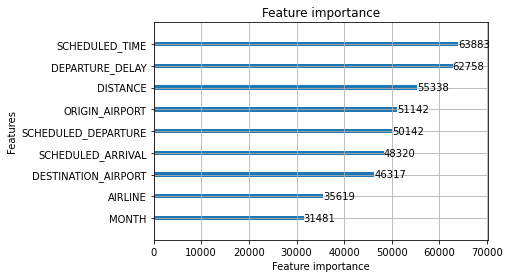

In [17]:
lgb.plot_importance(model_lgb)